### Imports

In [1]:
import numpy as np
import scipy as sp
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams, colors
from tqdm import tqdm
import emcee
import corner
import plotly.express as px
import plotly.graph_objects as go
import re
import glob

%matplotlib inline
# figure size in inches
rcParams['figure.figsize'] = 12,8
rcParams['axes.formatter.useoffset'] = False

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import plotly
from IPython.display import display, HTML

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

In [2]:
from src.fitting import analytical


In [3]:
num_stars = "Number of Stars"
num_planets = "Number of Planets"

semi_major_axis =  "Orbit Semi-Major Axis [au]"
planet_radius =  "Planet Radius [Jupiter Radius]"
planet_mass = 'Planet Mass or Mass*sin(i) [Jupiter Mass]'
planet_density =  "Planet Density [g/cm**3]"
eccentricity = "Eccentricity"

spectral_type = 'Spectral Type'
stellar_eff_temperature = 'Stellar Effective Temperature [K]'
stellar_radius = 'Stellar Radius [Solar Radius]'
stellar_mass = 'Stellar Mass [Solar mass]'
stellar_metallicity = 'Stellar Metallicity [dex]'
stellar_metallicity_ratio = 'Stellar Metallicity Ratio'
stellar_age = 'Stellar Age [Gyr]'
stellar_density = 'Stellar Density [g/cm**3]'


ratio_a_stellar_radius = "Ratio of Semi-Major Axis to Stellar Radius"
ratio_planet_to_stellar_radius = 'Ratio of Planet to Stellar Radius'

In [4]:
earth_radius = 6.378e6  # m
earth_mass = 5.972e24  # kg
solar_radius = 6.957e8 # m
solar_mass = 1.989e30  # kg
jupiter_mass = 1.898e27 # kg

### Investigate observed decay rates

#### Recap

In [5]:
df = pd.read_csv("./results/14_results_df.csv", index_col=0)
df = df.rename(columns={"planet.1": "planet"})
transit_df = pd.read_csv("./results/14_transit_df.csv", index_col=0)

In [6]:
set(df.columns)

{'-dP/dE [ms/epoch]',
 '-dP/dE [s/epoch]',
 '-dP/dE error [ms/epoch]',
 '-dP/dt [s/s]',
 '-da/dt [m/s]',
 'Argument of Periastron Limit Flag',
 'Argument of Periastron Lower Unc. [deg]',
 'Argument of Periastron Reference',
 'Argument of Periastron Upper Unc. [deg]',
 'Argument of Periastron [deg]',
 'B (Johnson) Magnitude',
 'B (Johnson) Magnitude Lower Unc',
 'B (Johnson) Magnitude Reference',
 'B (Johnson) Magnitude Upper Unc',
 'Circumbinary Flag',
 'Controversial Flag',
 'Data show Transit Timing Variations',
 'Dec [deg]',
 'Dec [sexagesimal]',
 'Detected by Astrometric Variations',
 'Detected by Disk Kinematics',
 'Detected by Eclipse Timing Variations',
 'Detected by Imaging',
 'Detected by Microlensing',
 'Detected by Orbital Brightness Modulations',
 'Detected by Pulsar Timing Variations',
 'Detected by Pulsation Timing Variations',
 'Detected by Radial Velocity Variations',
 'Detected by Transits',
 'Discovery Facility',
 'Discovery Instrument',
 'Discovery Locale',
 'Discove

In [7]:
len(transit_df)

19202

In [8]:
len(df)

442

We now have results for 442 planets, many more than the 70 we had previously.

In [9]:
df["observed_dP_dE_ms"] = np.abs(df.mu.where(df.mu < 0.0, 0.0))
df["error_observed_dP_dE_ms"] = df.sd

df["theoretical_dP_dE_ms"] = df["-dP/dE [ms/epoch]"]
df["error_theoretical_dP_dE_ms"] = df["-dP/dE error [ms/epoch]"]

In [17]:
df.planet

planet
55cnce                  55cnce
corot1                  corot1
corot11                corot11
corot19                corot19
corot2                  corot2
corot5                  corot5
corot6                  corot6
epic21194521      epic21194521
epic246851721    epic246851721
g940                      g940
gj1132                  gj1132
gj1214                  gj1214
gj3470                  gj3470
gj357                    gj357
gj436                    gj436
gj9827                  gj9827
gj9827c                gj9827c
hatp1                    hatp1
hatp11                  hatp11
hatp12                  hatp12
hatp13                  hatp13
hatp14                  hatp14
hatp15                  hatp15
hatp16                  hatp16
hatp17                  hatp17
hatp18                  hatp18
hatp19                  hatp19
hatp2                    hatp2
hatp20                  hatp20
hatp21                  hatp21
hatp22                  hatp22
hatp23                  hatp23
h

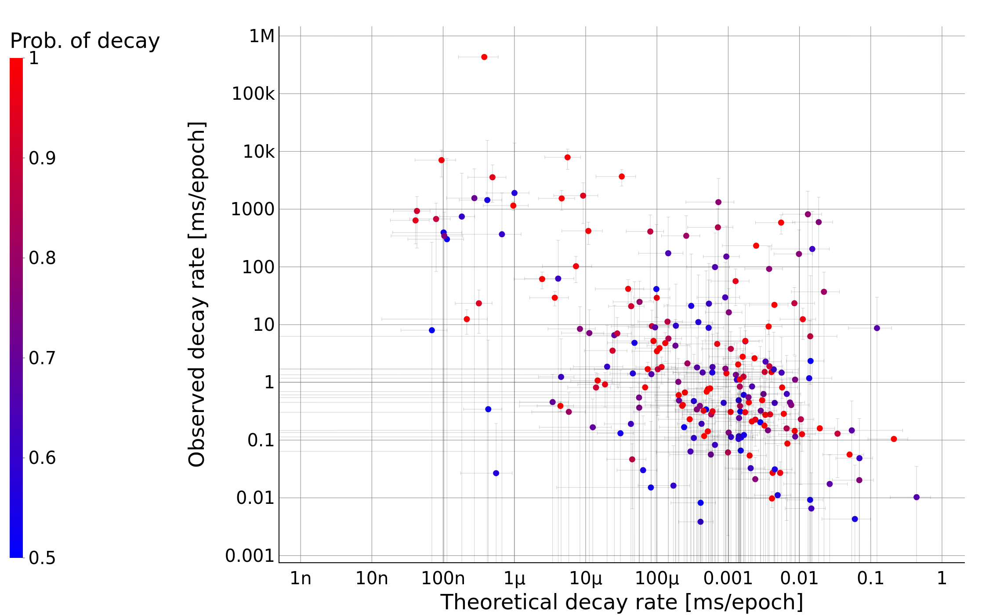

In [11]:
fig = px.scatter(df, x="theoretical_dP_dE_ms", y="observed_dP_dE_ms", symbol="planet", log_x=True, log_y=True,
             symbol_sequence= ['circle',],
             error_x="error_theoretical_dP_dE_ms",
             error_y="error_observed_dP_dE_ms",
             color="prob_decay",
             range_color=[0.5, 1.0],
             color_continuous_scale="bluered",
             labels={"theoretical_dP_dE_ms": "Theoretical decay rate [ms/epoch]", "observed_dP_dE_ms": "Observed decay rate [ms/epoch]", "prob_decay": "Prob. of decay"},
             height=1400, width=2200)

fig.update_traces(marker={'size': 14})
fig.update_traces(error_x={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_traces(error_y={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_layout(
    font=dict(
        size=40,
        color='black',
        family='DejaVu Sans',    
    ),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    showlegend=False
)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')

# fig.add_traces(go.Scatter(x=x, y=x, mode='lines', name="Theory = Observation", line_color="green"))

# example_errors = [0.001, 0.01, 1.0, 100.0]
# x = np.logspace(-9, 1)
# for error in example_errors:
#     bounds = x + (error * 3)
#     fig.add_traces(go.Scatter(x=x, y=bounds, mode='lines', name=f"{error} ms/epoch 3σ error bound"))

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.4, ticks="outside"))
fig.show()

The uncertainty lines show us that if the uncertainty in decay rate is large, then the observed decays could well be within 3 sigma of the theoretical decay and it can be hard to distinguish correct from incorrect theory.

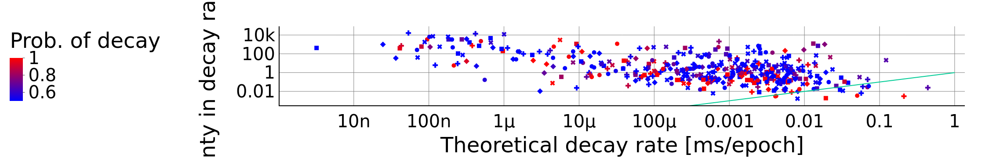

In [139]:
fig = px.scatter(df, x="theoretical_dP_dE_ms", y="error_observed_dP_dE_ms", color="prob_decay", symbol="planet", log_x=True, log_y=True,
                 range_color=[0.5, 1.0],
                 color_continuous_scale="bluered",
                 labels={"theoretical_dP_dE_ms": "Theoretical decay rate [ms/epoch]", "error_observed_dP_dE_ms": "1σ uncertainty in decay rate [ms/epoch]", "prob_decay": "Prob. of decay"},
                 height=1000)
fig.update_traces(marker={'size': 10})
fig.update_traces(error_x={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_traces(error_y={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_layout(
    font=dict(
        size=30,
    ),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    showlegend=False
)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')

x = [0, 1]
fig.add_traces(go.Scatter(x=x, y=x, mode='lines', name="Theory = 1σ error bound"))

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.4, ticks="outside"))
fig.show()

#### How does observed decay rate vary with semi major axis?

In [89]:
e = 0.01
Rs = solar_radius # stellar radius
Rp = 3 * earth_radius
Ms = 1.5 * solar_mass
Mp = 20 * earth_mass
a = 0.05 * sp.constants.au # semi major axis
P = 1
Qs = 10 ** 5.5 # np.logspace(4, 9)

Why does decay rate increase with semi major axis, something seems wrong there?
* Investigate a few example planets that appear wrong, why do they exhibit TTVs?

In [90]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 color=df["Number of Planets"].astype(str),
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]", "color": "Num planets"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * Mp) / Qs) * (1 + (57/4 * e ** 2))) * ((x*sp.constants.au) ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt((x*sp.constants.au) / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    
    fig.show()
    
plot_relationship(semi_major_axis)

In [91]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 color=df["Number of Stars"].astype(str),
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]", "color": "Num stars"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * Mp) / Qs) * (1 + (57/4 * e ** 2))) * ((x*sp.constants.au) ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt((x*sp.constants.au) / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    
    fig.show()
    
plot_relationship(semi_major_axis)

In [92]:
def plot_relationship(variable, log=False):
    fig = px.scatter(df, x=variable, y="observed_dP_dE_ms", symbol="planet", log_x=log, log_y=True,
                 error_y="error_observed_dP_dE_ms",
                 color=df["Eccentricity"],
                 labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]", "color": "Num planets"},
                 height=1000)
    
    x = np.linspace(df[variable].min(), df[variable].max())
    stellar_tide_da_dt = \
        (9/2 * ((sp.constants.G / Ms) ** 0.5) * ((Rs ** 5 * Mp) / Qs) * (1 + (57/4 * e ** 2))) * ((x*sp.constants.au) ** -5.5)
    dP_dt = 3 * sp.constants.pi * np.sqrt((x*sp.constants.au) / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
    dP_dE = dP_dt * (P / 365)
    fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    
    fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=0, ticks="outside"))
    fig.show()
    
plot_relationship(semi_major_axis)

#### What's up with TOI 216?

#### What's up with HD 191939?

#### What's up with HD 17156 b?

In [93]:
HD_17156_df = transit_df[transit_df.planet == "hd17156"].copy()
HD_17156_df

,planet,transit_time,error,source,epoch
0,hd17156,2.454354e+06,0.020000,Transit_Timing_En_Masse,0.0
1,hd17156,2.454375e+06,0.002000,Transit_Timing_En_Masse,1.0
2,hd17156,2.454417e+06,0.002100,Transit_Timing_En_Masse,3.0
3,hd17156,2.454438e+06,0.000770,Transit_Timing_En_Masse,4.0
4,hd17156,2.454460e+06,0.000450,ExoClock_Literature,5.0
5,hd17156,2.454757e+06,0.002050,ExoClock_Literature,19.0
6,hd17156,2.454778e+06,0.000081,Transit_Timing_En_Masse,20.0
7,hd17156,2.454820e+06,0.000108,ExoClock_Literature,22.0
8,hd17156,2.454884e+06,0.000103,ExoClock_Literature,25.0
9,hd17156,2.455499e+06,0.003000,NaN,54.0


In [94]:
# plot_fit(HD_17156_df)

According to the NASA exoplanet archive this planet (a relatively cool hot Jupiter) follows a highly eccentric (e = 0.68) orbit.

Suggestion: discard any high eccentricity systems.

#### What's up with Wasp 184?

In [95]:
wasp_184_df = transit_df[transit_df.planet == "wasp184"].copy()
wasp_184_df

,planet,transit_time,error,source,epoch
0,wasp184,2.457630e+06,0.001000,Transit_Timing_En_Masse,0.0
1,wasp184,2.458604e+06,0.002487,Transit_Timing_En_Masse,188.0
2,wasp184,2.458609e+06,0.002057,Transit_Timing_En_Masse,189.0
3,wasp184,2.458620e+06,0.002637,Transit_Timing_En_Masse,191.0


In [96]:
# plot_fit(wasp_184_df)

Suggestion: remove any planets with less than ten observed transits.

### Removing problematic systems:

#### Removing multi-planet systems, high eccentricity planets and binaries/trinaries:

In [97]:
filtered_df = df[(df["Number of Planets"] == 1)]  # & (df["Eccentricity"] < 0.1) & (df["Number of Stars"] < 2)
len(filtered_df)

371

#### Removing planets with few transits

In [98]:
transit_df.groupby("planet").size().head()

planet
55cnce      92
corot1     104
corot10      1
corot11     22
corot14      1
dtype: int64

In [99]:
filtered_df = filtered_df[transit_df.groupby("planet").size().reindex_like(filtered_df) >= 10]
len(filtered_df)

303

#### Removing brown dwarfs

In [100]:
filtered_df = filtered_df[filtered_df[planet_mass] < 10]  # filter out planets more than 10 Jupiter masses
len(filtered_df)

301

In [101]:
fig = px.scatter(filtered_df, x=semi_major_axis, y="observed_dP_dE_ms", symbol="planet", log_x=False, log_y=True,
             error_y="error_observed_dP_dE_ms",
             labels={"observed_dP_dE_ms": "Observed decay rate [ms/epoch]", "color": "Num planets"},
             height=1000)

x = np.linspace(filtered_df[semi_major_axis].min(), filtered_df[semi_major_axis].max())
stellar_tide_da_dt = \
    (9/2 * ((sp.constants.G / solar_mass) ** 0.5) * ((solar_radius ** 5 * jupiter_mass) / Qs) * (1 + (57/4 * 0 ** 2))) * ((x*sp.constants.au) ** -5.5)
dP_dt = 3 * sp.constants.pi * np.sqrt((x*sp.constants.au) / (sp.constants.G * Ms)) * stellar_tide_da_dt * 365 * 24 * 60 * 60 * 1000
dP_dE = dP_dt * (0.1 / 365)
fig.add_traces(go.Scatter(x=x, y=dP_dE, mode='lines', name="Theory"))

fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 0.5})
fig.update_traces(error_y={'thickness': 0.5})

fig.show()

### Correcting for other things that might affect decay

Summary: either something is wrong with the observational modelling, or we are wrong to assume that mass and radius of the star, mass of the planet and eccentricity are independent of semi major axis. Let's see if that's true and try and correct for that in our sample.

Recall that the instantaneous theorised tidal decay due to stellar tidal dissipation is:
    
$$
\dot{a}=\frac{9}{2} \sqrt{\frac{G}{M_*}} \frac{R_*^5 M_P}{Q_*^{\prime}}\left(1+\frac{57}{4} e^2\right)a^{-5.5}
$$

If planetary pass or stellar radius are increasing functions w.r.t. semi major axis, or stellar mass is a decreasing function, this could mask the effect of semi major axis on decay rate.

In [102]:
def plot_relationship(df, x=semi_major_axis, y=stellar_mass):
    fig = px.scatter(df, x=x, y=y, symbol="planet", log_x=False, log_y=False,
                 height=1000)
    
    fig.update_traces(marker={'size': 8})
    fig.update_traces(error_x={'thickness': 0.5})
    fig.update_traces(error_y={'thickness': 0.5})
    
    fig.show()

In [103]:
num_stars = "Number of Stars"
num_planets = "Number of Planets"

semi_major_axis =  "Orbit Semi-Major Axis [au]"
planet_mass = 'Planet Mass or Mass*sin(i) [Jupiter Mass]'
planet_density =  "Planet Density [g/cm**3]"
eccentricity = "Eccentricity"

stellar_radius = 'Stellar Radius [Solar Radius]'
stellar_mass = 'Stellar Mass [Solar mass]'


ratio_a_stellar_radius = "Ratio of Semi-Major Axis to Stellar Radius"
ratio_planet_to_stellar_radius = 'Ratio of Planet to Stellar Radius'

In [104]:
plot_relationship(filtered_df, y=stellar_mass)

In [105]:
plot_relationship(filtered_df, y=stellar_radius)

In [106]:
plot_relationship(filtered_df, y=planet_mass)

In [107]:
plot_relationship(filtered_df, y=eccentricity)

There seems to be some kind of relationship between stellar radius and semi major axis. Given the $R_{*}^5$ relationship with decay, it's very possible this is what's masking the effect of semi major axis.

Why could this be?
* Maybe we see fewer planets close to large, massive stars because they have already decayed into the star.
* It's hard to form large planets (the kind we are biased towards detecting with transits) around large, massive stars.
* Perhaps age, as the star gets larger? But this does not appear to be backed up by the plot of stellar age vs radius.

In [108]:
plot_relationship(filtered_df, x=stellar_radius, y=stellar_age)

In [109]:
plot_relationship(filtered_df, x=stellar_radius, y=stellar_mass)

In [110]:
Y = filtered_df[stellar_radius].values.reshape(-1, 1)[:50]
X = filtered_df[semi_major_axis].values.reshape(-1, 1)[:50]

coef, _, _, _ = np.linalg.lstsq(X, Y, rcond=None)
coef = coef.item()
coef

25.4938589782817

In [111]:
fig = px.scatter(filtered_df, x=semi_major_axis, y=stellar_radius, symbol="planet", log_x=False, log_y=False,
             height=1000)

fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 0.5})
fig.update_traces(error_y={'thickness': 0.5})

fig.add_traces(go.Scatter(x=[0, 0.1], y=[0, coef*0.1], mode='lines', name="Line of best fit", line=dict(color="red")))

fig.show()

Let's approximate $M_{*}=\frac{R_{*}}{R_{\odot}} M_{\odot}$ by inspection and $R_{*}=27a R_{\odot}$ by the regression above.

The original equation was:

$$
\dot{a}=\frac{9}{2} \sqrt{\frac{G}{M_*}} \frac{R_*^5 M_P}{Q_*^{\prime}}\left(1+\frac{57}{4} e^2\right)a^{-5.5}
$$

If we apply the above empirical relationships, we see that:

$$\dot{a} \propto a^{-1}$$


$$\dot{a} \propto \frac{1}{Q'_{*}}$$

ignoring eccentricity, which aligns more closely with our observations.

We can infer the semi major axis from observed decay using Kepler's third law:

$$
\begin{aligned}
P^2 & =\frac{4 \pi^2}{G M_*} a^3 \\
a & =\left(\frac{G M_*}{4 \pi^2}\right)^{\frac{1}{3}} p^{\frac{2}{3}} \\
\Rightarrow \dot{a} & =\frac{2}{3}\left(\frac{G M_*}{4 \pi^2}\right)^{\frac{1}{3}} \frac{d P}{d E} P^{-\frac{4}{3}}
\end{aligned}
$$

Then we plug the $\dot{a}$ back into the tidal decay equation to recover the "inferred" semi major axis.

In [112]:
M_star = filtered_df[stellar_mass] * solar_mass
R_star = filtered_df[stellar_radius] * solar_radius
M_planet = filtered_df[planet_mass] * jupiter_mass
Qs = 10 ** 5.5

dP_dE = filtered_df.observed_dP_dE_ms / 1000  # dP/dE in seconds
dP_dE_error = filtered_df.error_observed_dP_dE_ms / 1000
P = filtered_df["Orbital Period [days]"] * 24 * 60 * 60  # period in seconds
ecc = filtered_df["Eccentricity"]

a_dot = (2/3) * np.power((sp.constants.G * M_star / (4 * (np.pi ** 2))), 1/3) * dP_dE * np.power(P, -4/3)  # in m/s
error_a_dot = (2/3) * np.power((sp.constants.G * M_star / (4 * (np.pi ** 2))), 1/3) * dP_dE_error * np.power(P, -4/3)

a = filtered_df[semi_major_axis]

In [113]:
a_dot["wasp12"]  # aligns reasonably closely with the theory

1.4711572801705773e-05

In [114]:
fig = px.scatter(filtered_df, x=a, y=a_dot, error_y=error_a_dot, symbol="planet", log_x=True, log_y=True, height=1000, labels={"y": "Observed decay rate [m/s]"})
fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 0.5})
fig.update_traces(error_y={'thickness': 0.5})
fig.show()

In [115]:
inferred_a = np.power((4.5 * np.sqrt(sp.constants.G/M_star) * (R_star**5) * M_planet * (1 + (57/4)*(ecc**2)) / (Qs * a_dot)), (1/5.5)) / sp.constants.au

fig = px.scatter(filtered_df, x=a, y=inferred_a, log_x=False, symbol="planet", log_y=False, height=1000, labels={"y": "Semi-major axis inferred from observed decay [au]"})
fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 0.5})
fig.update_traces(error_y={'thickness': 0.5})
fig.add_traces(go.Scatter(x=[0, 0.1], y=[0, 0.1], mode='lines', line=dict(color="red")))
fig.show()

i.e. they still seem to be decaying more than they should, but it's not as stark a difference as before.

There's still a bit more decay than should be expected from the theory alone, but it's clearly not as great as we previously thought. They are very roughly of the right order, and it is very possible this remaining difference can be explained by different Q*, which can also vary by a few orders of magnitude.

### Distribution of $Q'_{*}$

Rearranging the tidal decay equation:

$$
Q_*^{\prime}=\frac{9}{2} \sqrt{\frac{G}{M_*}} \frac{R_*^5 M_P}{\dot{a}a^{5.5}}(1 + \frac{57}{4}e^2)
$$

In [116]:
np.logspace(0, 9, 10)

array([1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07,
       1.e+08, 1.e+09])

In [117]:
Q_star = 9/2 * ((sp.constants.G / M_star) ** 0.5) * (R_star ** 5) * M_planet * (1 + (57/4)*(ecc**2)) / (a_dot * ((a * sp.constants.au) ** 5.5))

Q_star = Q_star[Q_star != np.inf]

In [118]:
np.format_float_scientific(Q_star.loc["wasp12"])

'2.9340956646443333e+05'

In [119]:
np.log10(Q_star.loc["wasp12"])

5.467474269681032

/tmp/ipykernel_6967/2306140312.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: xlabel="$Q'_{*}$", ylabel='Freq.'>

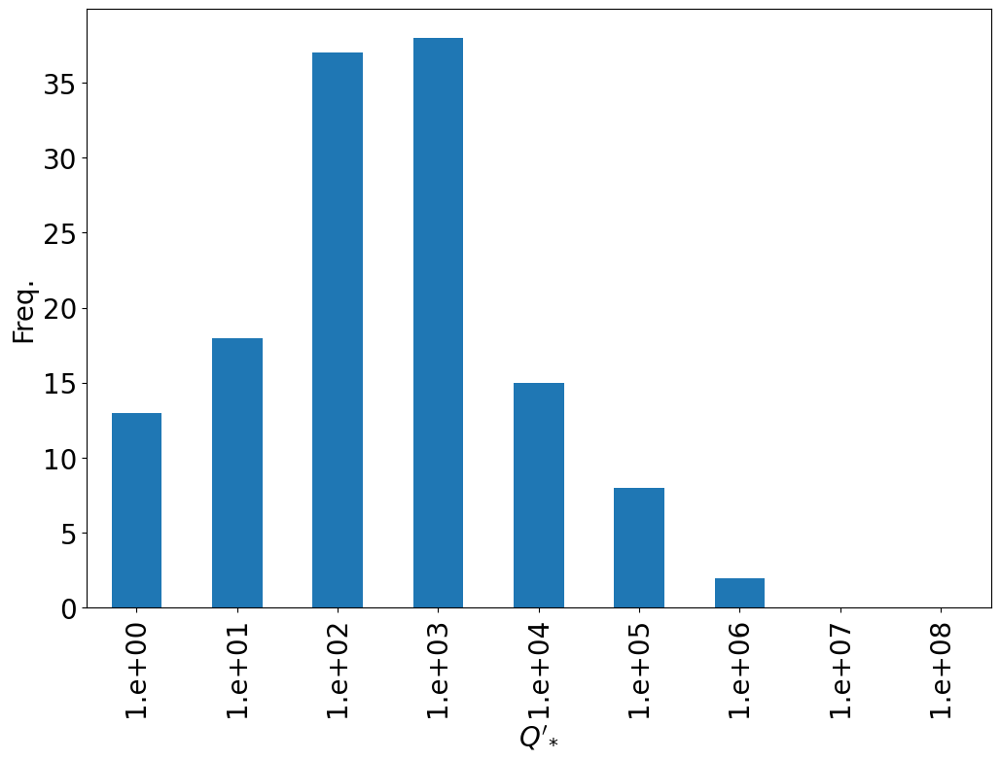

In [120]:
binned = Q_star.groupby(pd.cut(Q_star, bins=np.logspace(0, 9, 10))).count()
binned.index = binned.index.map(lambda interval: np.format_float_scientific(interval.left))

binned.plot.bar(ylabel="Freq.", xlabel="$Q'_{*}$")

### Let's try the analysis limiting by various statistical measures:

#### Planets with small error bounds

/tmp/ipykernel_6967/1466388360.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



<Axes: xlabel="$Q'_{*}$", ylabel='Freq.'>

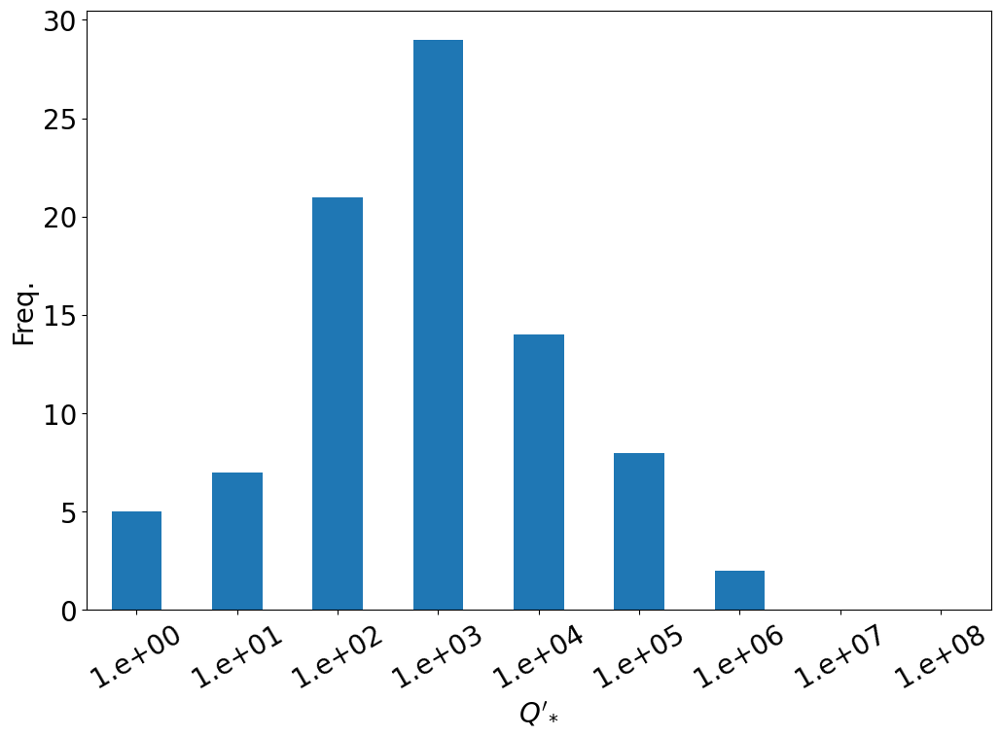

In [121]:
filtered_Q_star = Q_star[filtered_df.error_observed_dP_dE_ms < 1.0]

binned = filtered_Q_star.groupby(pd.cut(filtered_Q_star, bins=np.logspace(0, 9, 10))).count()
binned.index = binned.index.map(lambda interval: np.format_float_scientific(interval.left))

plt.rcParams.update({'font.size': 20})
binned.plot.bar(ylabel="Freq.", xlabel="$Q'_{*}$", rot=30)

#### Planets with a high probability of decay

Remove the bulk of the population which are consistent with 0 decay to 3 standard deviation.

In [122]:
sp.stats.norm.cdf(3)  # 3 standard deviations is equal to 99.9% one tailed cumulative probability

0.9986501019683699

In [123]:
# filtered_Q_star = Q_star[filtered_df.prob_decay >= 0.99]

# binned = filtered_Q_star.groupby(pd.cut(filtered_Q_star, bins=np.logspace(0, 9, 10))).count()
# binned.index = binned.index.map(lambda interval: np.format_float_scientific(interval.left))

# binned.plot.bar(ylabel="Freq.", xlabel="$Q'_{*}$")

Unsurprisingly if we try to filted for those that appear to be decaying, we bias our distribution towards lower Q* which leads to higher (and therefore more evidently visible) decay.

#### Planets whose theory bounds overlap with observation bounds

Remove planets for which the 3 sigma bound on the theory does not overlap with the 3 sigma bound on the observation, for a range of realistic Q* and Qp.

In [124]:
filtered_df.mu.loc["wasp12"]

-0.0561158607580985

In [125]:
observed_decay = -filtered_df.mu
observed_error_ms = filtered_df.sd

In [126]:
theoretical_decay = filtered_df["-dP/dE [ms/epoch]"]
theoretical_error_ms = filtered_df["-dP/dE error [ms/epoch]"]

In [127]:
upper_observed = observed_decay + 3 * observed_error_ms
lower_observed = observed_decay - 3 * observed_error_ms

upper_theoretical = theoretical_decay + 3 * theoretical_error_ms
lower_theoretical = theoretical_decay - 3 * theoretical_error_ms

filter_by = (upper_observed > lower_theoretical) | (upper_theoretical > lower_observed)

In [128]:
# filtered_Q_star = Q_star[filter_by]

# binned = filtered_Q_star.groupby(pd.cut(filtered_Q_star, bins=np.logspace(0, 9, 10))).count()
# binned.index = binned.index.map(lambda interval: np.format_float_scientific(interval.left))

# binned.plot.bar(ylabel="Freq.", xlabel="$Q'_{*}$")

#### Planets whose decay fit has a higher Bayesian model evidence than a constant period fit

Use model evidence of constant period fit vs linear decay fit. If the evidence for the constant fit is higher, we ignore the planet as there is no evidence for decay.

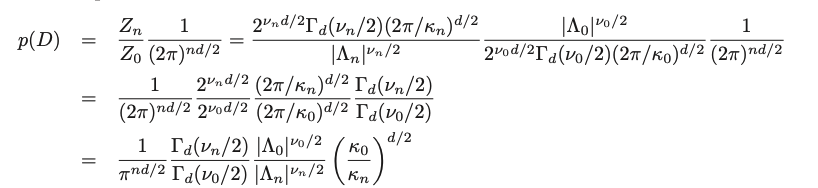

[Kevin P. Murphy, 2021](https://www.cs.ubc.ca/~murphyk/Papers/bayesGauss.pdf)

### How does $Q'_{*}$ vary with stellar properties?

Ok let's forget about filtering our planets beyond the simple "no multi-planet systems, and at least ten transits" heuristic for now. From what's left, how does $Q'_{*}$ appear to vary with stellar properties like age, density and effective temperature?

In [129]:
len(Q_star)

149

In [130]:
len(filtered_Q_star)

88

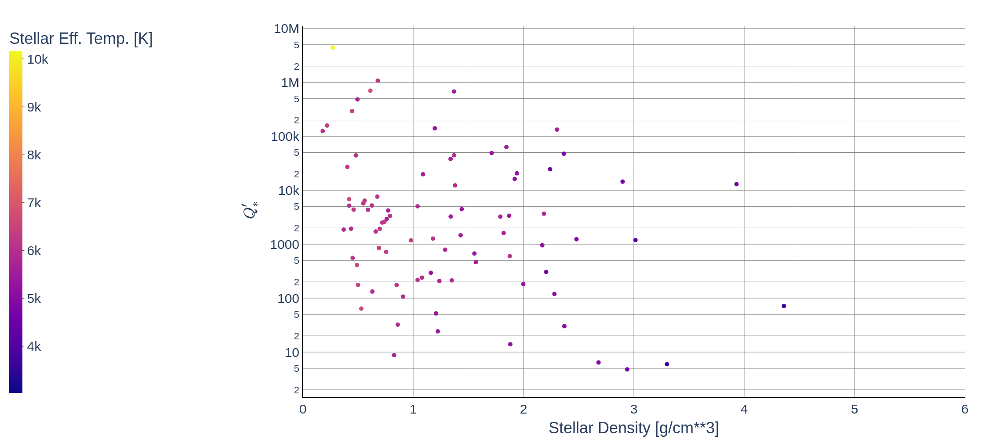

In [131]:
fig = px.scatter(filtered_df.loc[filtered_Q_star.index], x=stellar_density, y=filtered_Q_star, symbol="planet", symbol_sequence=["circle"], color=stellar_eff_temperature, log_x=False, log_y=True,
             labels={"y": "$\huge Q'_{*}$", "Stellar Effective Temperature [K]": "Stellar Eff. Temp. [K]"},
             height=1000)

fig.update_traces(marker={'size': 10})
fig.update_traces(error_x={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_traces(error_y={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_layout(
    font=dict(
        size=30,
    ),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    showlegend=False
)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')
fig.update_xaxes(range = [0, 6])

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.45, ticks="outside"))
fig.show()

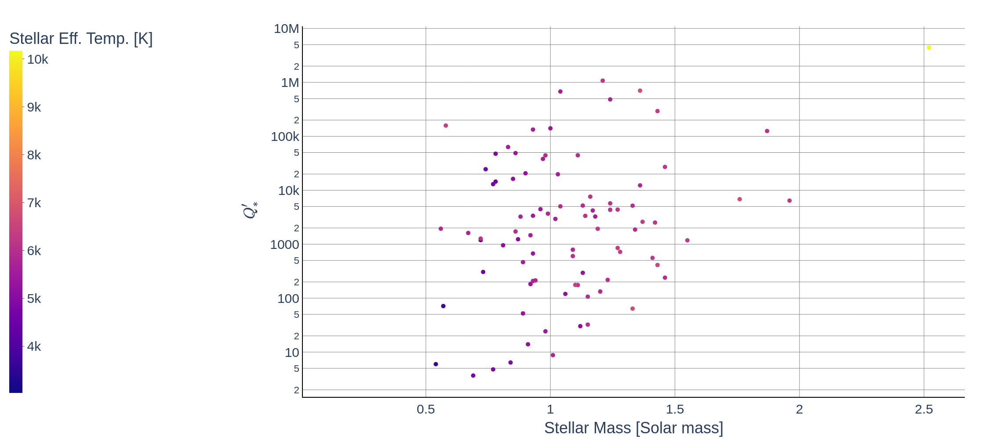

In [132]:
fig = px.scatter(filtered_df.loc[filtered_Q_star.index], x=stellar_mass, y=filtered_Q_star, symbol="planet", symbol_sequence=["circle"], color=stellar_eff_temperature, log_x=False, log_y=True,
             labels={"y": "$\huge Q'_{*}$", "Stellar Effective Temperature [K]": "Stellar Eff. Temp. [K]"},
             height=1000)

fig.update_traces(marker={'size': 10})
fig.update_traces(error_x={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_traces(error_y={'thickness': 1, 'color': 'rgba(0, 0, 0, 0.2)'})
fig.update_layout(
    font=dict(
        size=30,
    ),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    showlegend=False
)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.45, ticks="outside"))
fig.show()

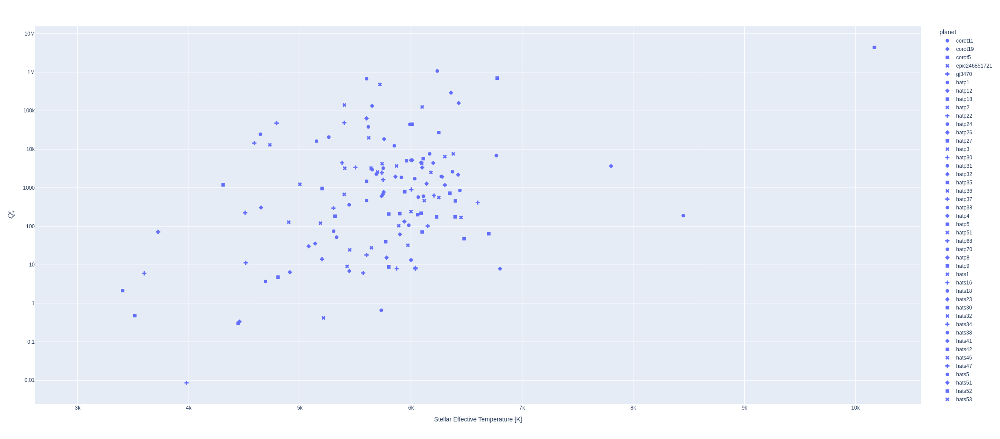

In [133]:
fig = px.scatter(filtered_df.loc[Q_star.index], x=stellar_eff_temperature, y=Q_star, symbol="planet", log_x=False, log_y=True,
             labels={"y": "$Q'_{*}$"},
             height=1000)

fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 0.5})
fig.update_traces(error_y={'thickness': 0.5})

fig.show()

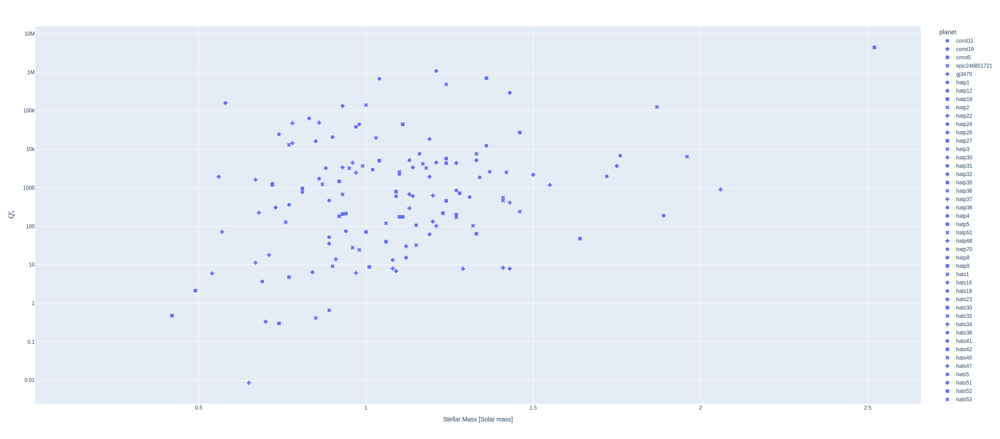

In [134]:
fig = px.scatter(filtered_df.loc[Q_star.index], x=stellar_mass, y=Q_star, symbol="planet", log_x=False, log_y=True,
             labels={"y": "$Q'_{*}$"},
             height=1000)

fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 0.5})
fig.update_traces(error_y={'thickness': 0.5})

fig.show()

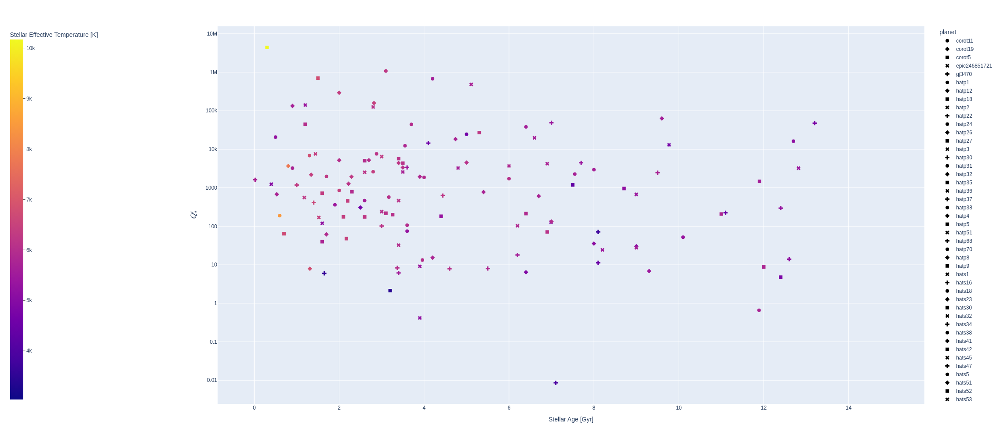

In [135]:
fig = px.scatter(filtered_df.loc[Q_star.index], x=stellar_age, y=Q_star, symbol="planet", color=stellar_eff_temperature, log_x=False, log_y=True,
             labels={"y": "$Q'_{*}$"},
             height=1000)

fig.update_traces(marker={'size': 8})
fig.update_traces(error_x={'thickness': 0.5})
fig.update_traces(error_y={'thickness': 0.5})

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.3, ticks="outside"))
fig.show()

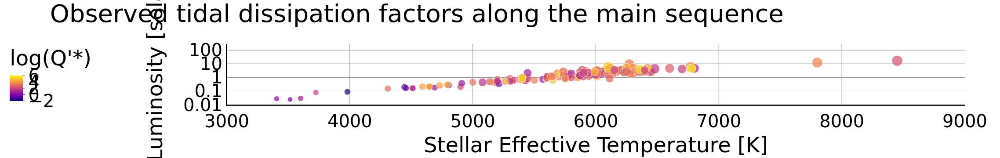

In [136]:
log_q_star = np.log10(Q_star)
log_q_star = log_q_star[~log_q_star.isna()]
temp_df = filtered_df.loc[log_q_star.index]
fig = px.scatter(temp_df, x="Stellar Effective Temperature [K]", y=10**temp_df["Stellar Luminosity [log(Solar)]"], size=temp_df["Stellar Mass [Solar mass]"], color=log_q_star, log_x=False, log_y=True,
             title="Observed tidal dissipation factors along the main sequence",
             labels={"y": "Stellar Luminosity [solar units]", "color": "log(Q'*)"},
             range_color=(-2, 6),
             range_x=(3e3, 9e3),
             height=1000)

fig.update_layout(legend= {'itemsizing': 'trace'})
fig.update_layout(
    font=dict(
        size=40,
        color='black',
        family='DejaVu Sans',
    ),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')

fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=1, x=-0.3, ticks="outside"))
fig.show()

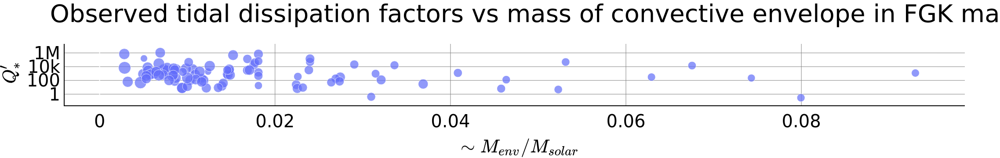

In [137]:
temp = filtered_df.loc[Q_star.index]
temp = temp[temp["Spectral Type"].str.slice(0, 1).isin(["F", "G", "K"])]

log_M_env = -((1)/(18000000))*(temp[stellar_eff_temperature]**2.0)
M_env = 10 ** log_M_env

fig = px.scatter(temp, x=M_env, y=Q_star[temp.index], size="Stellar Mass [Solar mass]", log_x=False, log_y=True,
            title="Observed tidal dissipation factors vs mass of convective envelope in FGK main sequence stars",
             labels={"y": "$\Huge{Q'_{*}}$", "x": "$ \Huge{\sim M_{env} / M_{solar}}$"},
             height=1000)

fig.update_layout(legend= {'itemsizing': 'trace'})
fig.update_layout(
    font=dict(
        size=40,
        color='black',
        family='DejaVu Sans',
    ),
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
)
fig.update_xaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', gridcolor='grey')

fig.show()

Next steps:
* dig deeper into the theory, do these relationships make sense? What do Adrian Barker and Gordon Ogilvie have to say on this topic?
* is it appropriate to model the observed transit time as a Gaussian? Yair Judkovsky et al think not